<a href="https://colab.research.google.com/github/FabrizioSandri/deep-learning-project/blob/main/Baseline_YOLO_%2B_CLIP.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/gdrive')

Mounted at /content/gdrive


# YOLO

/usr/local/lib/python3.9/dist-packages/torch/hub.py:286: UserWarning: You are about to download and run code from an untrusted repository. In a future release, this won't be allowed. To add the repository to your trusted list, change the command to {calling_fn}(..., trust_repo=False) and a command prompt will appear asking for an explicit confirmation of trust, or load(..., trust_repo=True), which will assume that the prompt is to be answered with 'yes'. You can also use load(..., trust_repo='check') which will only prompt for confirmation if the repo is not already trusted. This will eventually be the default behaviour
  warnings.warn(
Downloading: "https://github.com/ultralytics/yolov5/zipball/master" to /root/.cache/torch/hub/master.zip
YOLOv5 🚀 2023-4-17 Python-3.9.16 torch-2.0.0+cu118 CUDA:0 (Tesla T4, 15102MiB)



requirements: /root/.cache/torch/hub/requirements.txt not found, check failed.


100%|██████████| 14.1M/14.1M [00:00<00:00, 17.5MB/s]

Fusing layers... 
YOLOv5s summary: 213 layers, 7225885 parameters, 0 gradients
Adding AutoShape... 
image 1/1: 2497x3602 7 oranges
Speed: 1074.0ms pre-process, 4070.7ms inference, 43.7ms NMS per image at shape (1, 3, 448, 640)


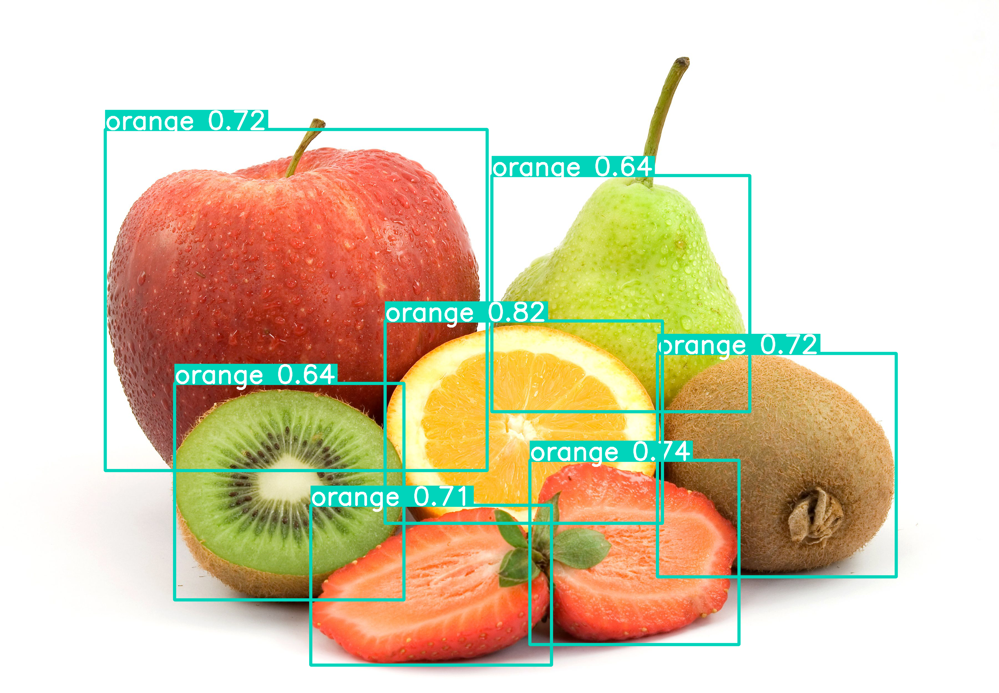

,xmin,ymin,xmax,ymax,confidence,class,name
0,1388.479492,1156.764160,2388.262207,1885.590454,0.815480,49,orange
1,1910.797852,1658.130005,2664.784424,2322.234619,0.741828,49,orange
2,2370.220703,1273.332153,3231.293457,2078.519043,0.719864,49,orange
3,379.927917,466.416656,1756.028931,1695.228760,0.716865,49,orange
4,1120.517212,1820.289917,1988.951294,2396.637451,0.713115,49,orange
5,1773.447388,632.972778,2703.695068,1483.660522,0.640635,49,orange
6,629.913330,1381.118164,1456.926636,2161.323486,0.635652,49,orange


In [2]:
import torch
from PIL import Image

# Model
yoloModel = torch.hub.load('ultralytics/yolov5', 'yolov5s', pretrained=True)

# Images
imgs = ['/content/gdrive/MyDrive/ImmaginiCLIP/fruits3.jpg']  # batch of images

# Inference
results = yoloModel(imgs)

# Results
results.print()
results.show()  # or .show()

results.xyxy[0]  # img1 predictions (tensor)

results.pandas().xyxy[0]  # img1 predictions (pandas)

## Extract all objects
Crop the images of all the objects

In [12]:
num_boxes = len(results.xyxy[0])
cropped_images = list()
img = Image.open(imgs[0])
for i in range(num_boxes):
  img2 = img.crop((float(results.xyxy[0][i][0]), float(results.xyxy[0][i][1]), 
                   float(results.xyxy[0][i][2]), float(results.xyxy[0][i][3])))
  cropped_images.append(img2)
  #display(img2)

# CLIP

# Preparation for Colab

Make sure you're running a GPU runtime; if not, select "GPU" as the hardware accelerator in Runtime > Change Runtime Type in the menu. The next cells will install the `clip` package and its dependencies, and check if PyTorch 1.7.1 or later is installed.

In [4]:
! pip install ftfy regex tqdm
! pip install git+https://github.com/openai/CLIP.git

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.1/53.1 kB 6.4 MB/s eta 0:00:00
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
  Cloning https://github.com/openai/CLIP.git to /tmp/pip-req-build-tl89sl9i
  Running command git clone --filter=blob:none --quiet https://github.com/openai/CLIP.git /tmp/pip-req-build-tl89sl9i
  Resolved https://github.com/openai/CLIP.git to commit a9b1bf5920416aaeaec965c25dd9e8f98c864f16
  Preparing metadata (setup.py) ... done
  Created wheel for clip: filename=clip-1.0-py3-none-any.whl size=1369398 sha256=4766ee6c5bb592819fdcd25301ca2fff015c524e019f76118dbbfe0d1cc97a69
  Stored in directory: /tmp/pip-ephem-wheel-cache-pogtumif/wheels/c8/e4/e1/11374c111387672fc2068dfbe0d4b424cb9cdd1b2e184a71b5
Successfully built clip


In [5]:
import numpy as np
from pkg_resources import packaging

# Loading the model

`clip.available_models()` will list the names of available CLIP models.

In [6]:
import clip

model, preprocess = clip.load("ViT-B/32")
model.cuda().eval()
input_resolution = model.visual.input_resolution
context_length = model.context_length
vocab_size = model.vocab_size

print("Model parameters:", f"{np.sum([int(np.prod(p.shape)) for p in model.parameters()]):,}")
print("Input resolution:", input_resolution)
print("Context length:", context_length)
print("Vocab size:", vocab_size)

100%|████████████████████████████████████████| 338M/338M [00:01<00:00, 285MiB/s]


Model parameters: 151,277,313
Input resolution: 224
Context length: 77
Vocab size: 49408


# Setting up input images and texts

We are going to feed 8 example images and their textual descriptions to the model, and compare the similarity between the corresponding features.

The tokenizer is case-insensitive, and we can freely give any suitable textual descriptions.

In [7]:
import os
import skimage
import IPython.display
import matplotlib.pyplot as plt
from PIL import Image
import numpy as np

from collections import OrderedDict
import torch

%matplotlib inline
%config InlineBackend.figure_format = 'retina'

# images in skimage to use and their textual descriptions
description = "a kiwi"

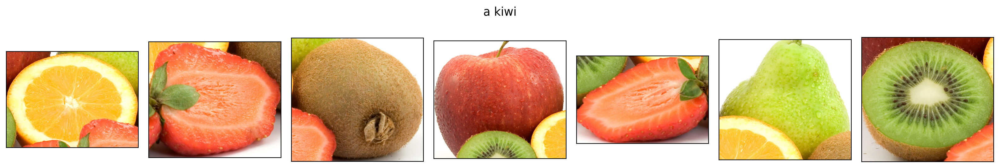

In [8]:
original_images = []
images = []
texts = []
plt.figure(figsize=(16, 5))

texts.append(description)

for i in range(num_boxes):
   image = cropped_images[i]

   plt.subplot(2, len(cropped_images), i + 1)
   plt.imshow(image)
   plt.xticks([])
   plt.yticks([])

   original_images.append(image)
   images.append(preprocess(image))

plt.suptitle(description)
plt.tight_layout()



## Building features

We normalize the images, tokenize each text input, and run the forward pass of the model to get the image and text features.

In [9]:
image_input = torch.tensor(np.stack(images)).cuda()
text_tokens = clip.tokenize("This is " + description).cuda()

with torch.no_grad():
    image_features = model.encode_image(image_input).float()
    text_features = model.encode_text(text_tokens).float()

## Calculating cosine similarity

We normalize the features and calculate the dot product of each pair.

In [10]:
image_features /= image_features.norm(dim=-1, keepdim=True)
text_features /= text_features.norm(dim=-1, keepdim=True)
similarity = text_features.cpu().numpy() @ image_features.cpu().numpy().T

Text(0.5, 1.05, 'a kiwi')

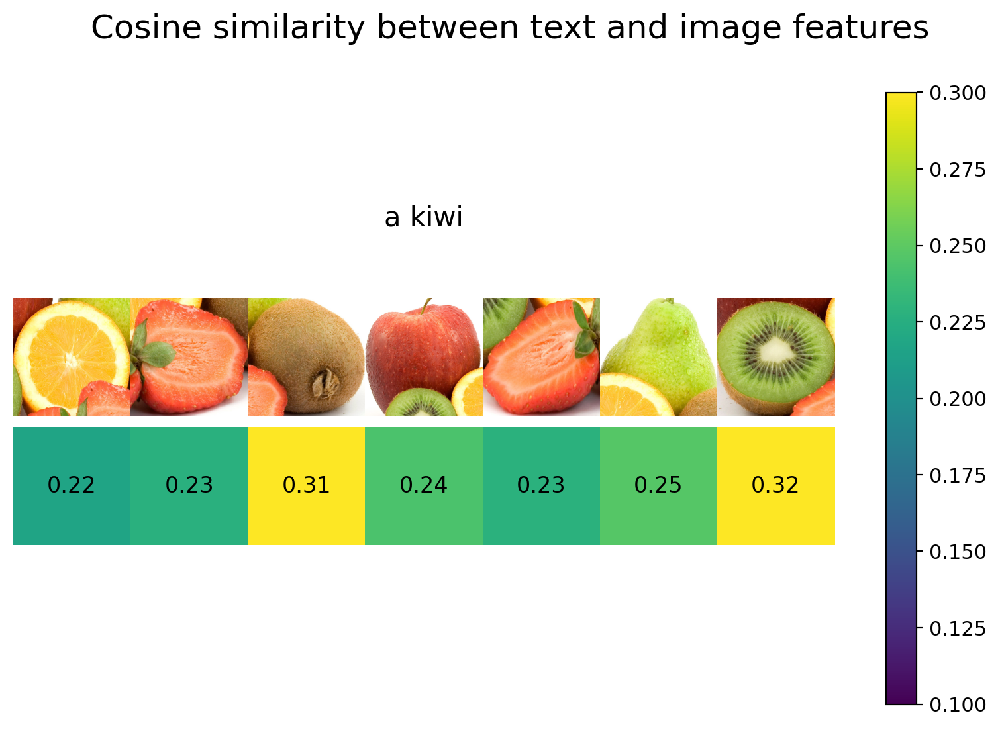

In [11]:
count = len(images)

plt.figure(figsize=(10,6))
plt.imshow(similarity, vmin=0.1, vmax=0.3)
plt.colorbar()
plt.yticks([])
plt.xticks([])

for i, image in enumerate(original_images):
    plt.imshow(image, extent=(i-0.5, i+0.5, -1.6, -0.6), origin="lower")

for x in range(similarity.shape[1]):
    for y in range(similarity.shape[0]):
        plt.text(x, y, f"{similarity[y, x]:.2f}", ha="center", va="center", size=12)

for side in ["left", "top", "right", "bottom"]:
  plt.gca().spines[side].set_visible(False)

plt.xlim([-0.5, count - 0.5])
plt.ylim([0.5, -2])

plt.suptitle("Cosine similarity between text and image features", size=18)
plt.title(description, y=1.05, size=15)